# Advanced Lane Finding
In this project, your goal is to write a software pipeline to identify the lane boundaries in a video, but the main output or product we want you to create is a detailed writeup of the project. Check out the writeup template for this project and use it as a starting point for creating your own writeup.

Steps I will covere:

1. Camera calibration
2. Distortion correction
3. Color/gradient threshold
4. Perspective transform

Two additional steps for the project:

1. Detect lane lines
2. Determine the lane curvature

In [75]:
# Importing modules

import cv2
import os
import numpy as np
import pickle
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

%matplotlib inline

## Camera Calibration

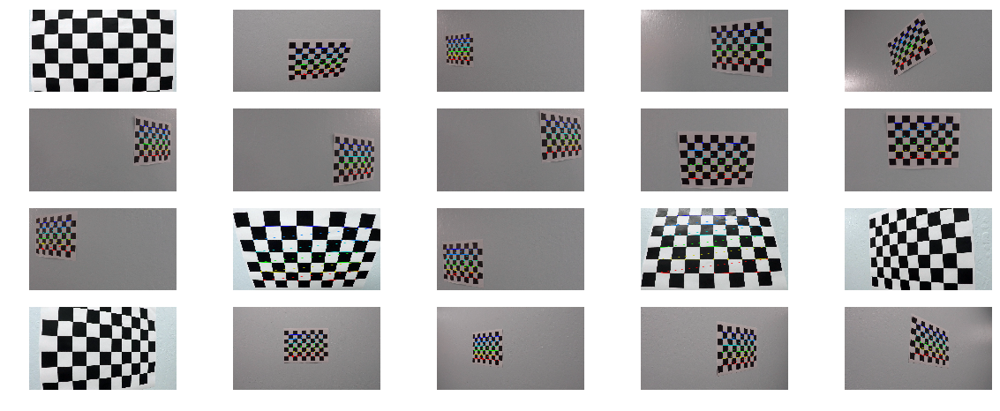

In [95]:
# show images of camera for calibration
images_folder = 'camera_cal/'
filenames = os.listdir(images_folder)
# print(filenames)
nx = 9
ny = 6
# Arrays to store object points and image points from all the images.
# setup object points
objp = np.zeros((ny*nx, 3), np.float32)
objp[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)
image_points = []
object_points = []

fig = plt.figure(figsize = (20, 10))
for i, image in enumerate(filenames):
    file_name = images_folder + image
#     print(file_name) 
    img = cv2.imread(file_name)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    fig.add_subplot(5,5,i+1)
    # If found, draw corners
    if ret == True:
        # Draw and display the corners
        cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        object_points.append(objp)
        image_points.append(corners)
        plt.imshow(img)
    else:
        plt.imshow(img)
    plt.axis('off')

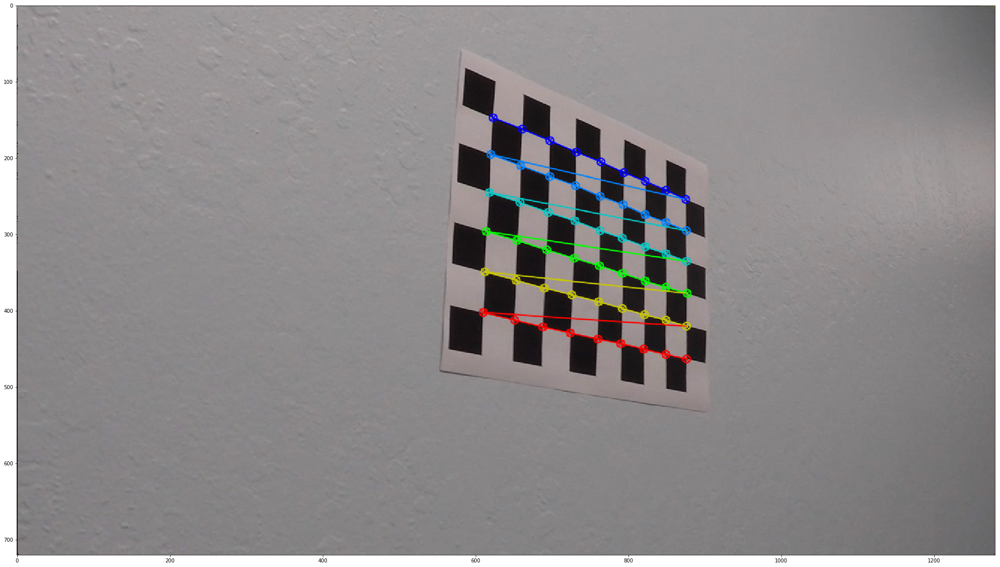

In [96]:
# draw one image with corenrs to see it better 
fig = plt.figure(figsize = (40, 20))
cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
object_points.append(objp)
image_points.append(corners)
plt.imshow(img)

In [97]:
# perform the calibaration and save calibration data in pickle
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(object_points, image_points, gray.shape[::-1], None, None)
img_size  = img.shape

data = [mtx,dist]
pickle.dump( data, open( "camera_calibration.pkl", "wb" ) )

Test Calibration and show matchin undistorted images with original image

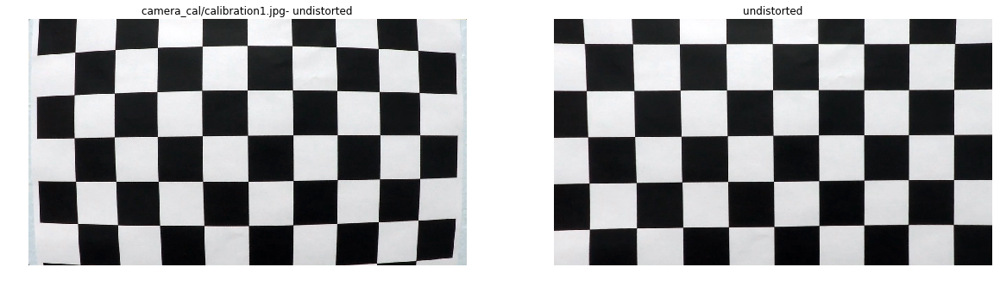

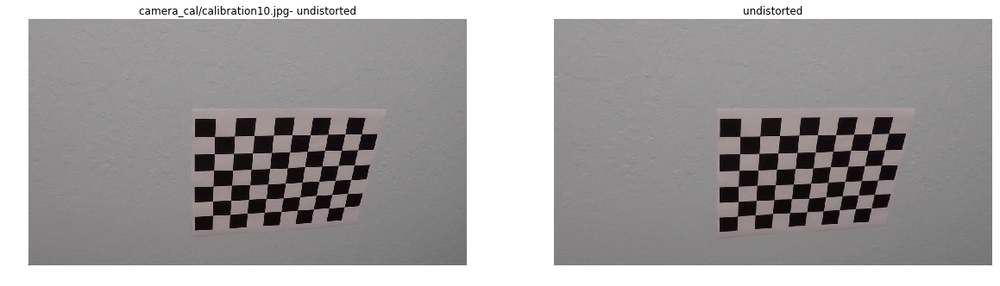

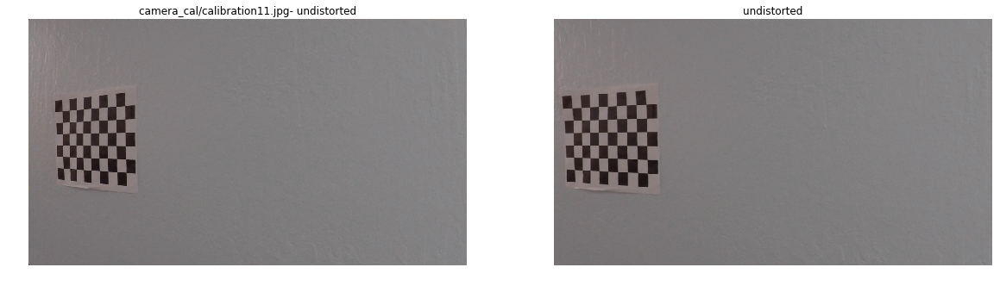

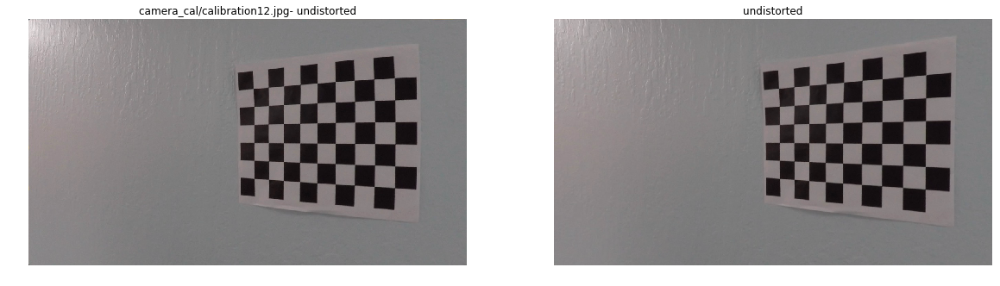

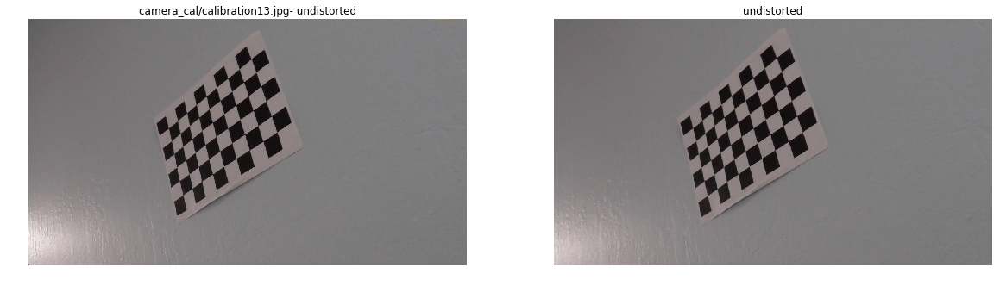

...

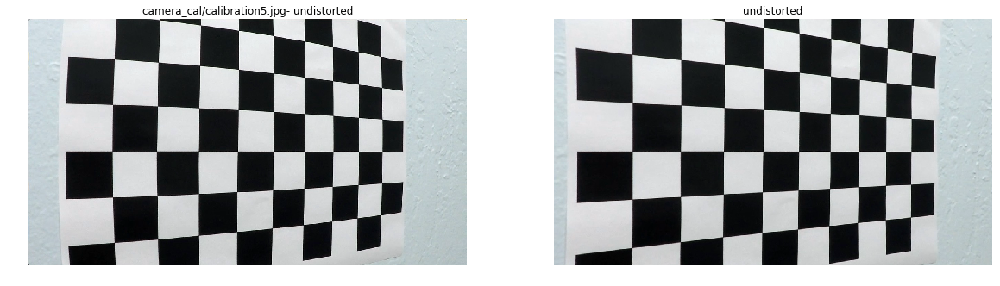

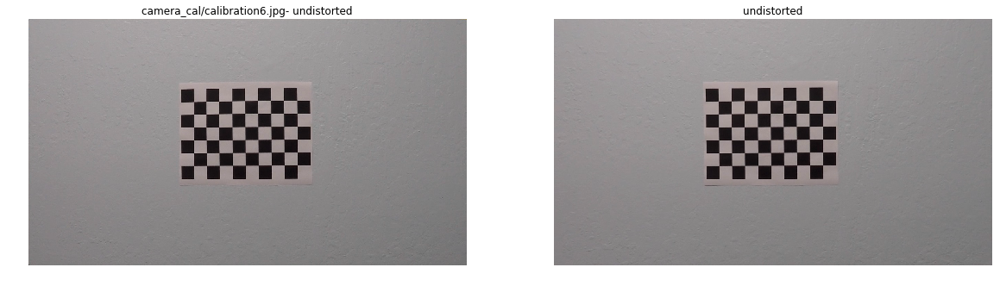

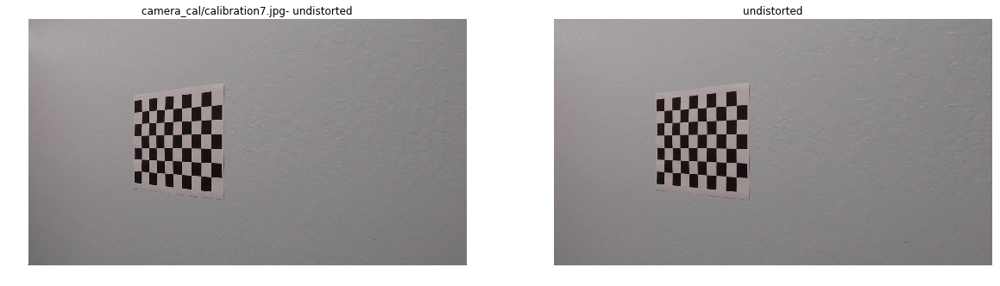

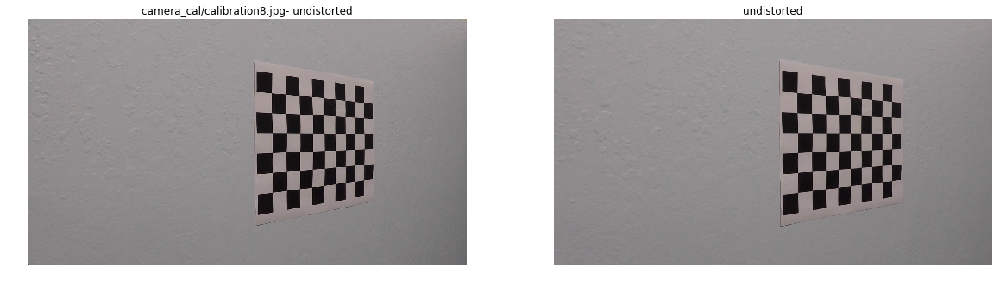

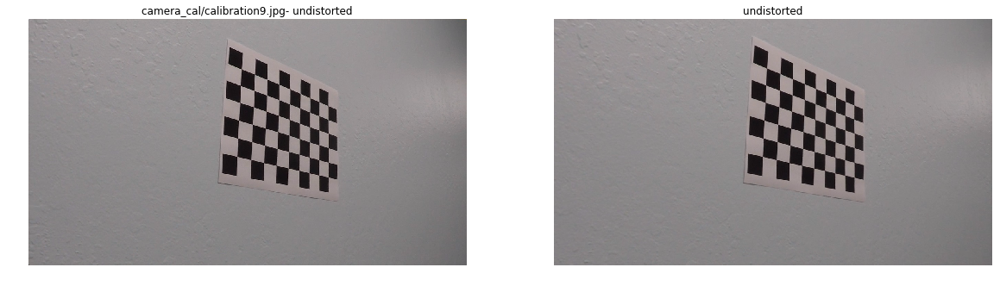

In [122]:
for file in filenames:
    file_name = images_folder + file
    img = cv2.imread(file_name)
    undist = cv2.undistort(img, mtx,dist,None, mtx)
    
    plt.figure(figsize=(20,10))    
    plt.subplot(1,2,1)
    plt.imshow(img)
    plt.title(file_name + '- undistorted')
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.imshow(undist)
    plt.axis('off')
    plt.title('undistorted')
    plt.show()